### Perform EDA and analysis
**program:** 04_dt_mod_h100 <br>
**author:** chris chan<br>
**date:** jan 27,2021<br>
**desc:** use clean df for analysis <br>

**datasources:**<br>
- sb_analytic (balanced df thru 2010)
- billboard analytic (hot 100 thru 2019)
- spotify random (random thru 2020)

- decision trees : https://towardsdatascience.com/light-on-math-machine-learning-intuitive-guide-to-understanding-decision-trees-adb2165ccab7
- gridsearch cv: https://towardsdatascience.com/understanding-decision-tree-classification-with-scikit-learn-2ddf272731bd
- random forest : https://towardsdatascience.com/an-implementation-and-explanation-of-the-random-forest-in-python-77bf308a9b76


Understand the endpoint:<br>
. what models to show?<br>
. what evals to show?<br>
. what graphs to show?<br>
. for each model (LR,KNN, etc.) do the features differ??

In [1]:
from importlib import reload
import pandas as pd
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
import seaborn as sns
from collections import OrderedDict
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

%config InlineBackend.figure_formats = ['svg']
%matplotlib inline

plt.rcParams['figure.figsize'] = (9, 6)
sns.set(context='notebook', style='whitegrid', font_scale=1.2)

In [2]:
from sqlalchemy import create_engine
import pandas as pd

In [3]:
from sklearn.model_selection import train_test_split

**1. Bring in data**

In [4]:
sbdf=pd.read_csv(r'../data/clean/sbdf_clean.csv')
sbdf.head(3)

,SpotifyID,danceability,energy,key,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,loudness,is_hit,year
0,285pBltuF7vW8TeWk8hdRR,0.511,0.566,6,0,0.200,0.3490,0.0,0.340,0.218,83.903,239836,-7.230,1,2018.0
1,7dt6x5M1jzdTEt8oCbisTK,0.680,0.578,10,1,0.040,0.3310,0.0,0.135,0.341,145.038,231267,-5.804,1,2018.0
2,78QR3Wp35dqAhFEc2qAGjE,0.897,0.662,1,0,0.292,0.0852,0.0,0.534,0.389,112.511,145543,-6.903,1,2019.0


**remove rows below 1960**

In [5]:
sbdf = sbdf[sbdf['year'] >= 1960] 

In [6]:
sbdf.columns = map(str.lower, sbdf.columns)

In [7]:
sbdf['decade'] = (sbdf.year//10*10).astype(int)

In [8]:
sbdf.decade.value_counts()

2000    6239
1990    3864
2010    3829
1980      91
1960       8
1970       4
Name: decade, dtype: int64

In [9]:
sbdf = sbdf[sbdf['decade'] >= 1990] 

In [10]:
sbdf['track_seconds'] = sbdf['duration_ms'] / 1000

In [11]:
sbdf.columns

Index(['spotifyid', 'danceability', 'energy', 'key', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms', 'loudness', 'is_hit', 'year', 'decade', 'track_seconds'],
      dtype='object')

**1. SPlit Data** 

In [46]:
# Split first to remove test data
# df_train_st, df_test_st = train_test_split(sbdf, test_size=0.2, random_state=42 ) #, stratify=y)

# # SPlit again between train and val
# df_train, df_test = train_test_split(df_train_st, test_size=0.25, random_state=42 ) #, stratify=y)

#df_train, df_test = train_test_split(bbdf, test_size=0.2, random_state=42)

In [47]:
from sklearn import tree

**2. Decision Tree Basic**

In [48]:
df_train.columns

Index(['spotifyid', 'danceability', 'energy', 'key', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms', 'loudness', 'is_hit', 'year', 'decade', 'track_seconds'],
      dtype='object')

In [49]:
# from sklearn.preprocessing import StandardScaler

# features = ['acousticness','danceability','energy','loudness','valence','track_seconds']
# labels = ['is_hit']        

# # Since we're using more than one feature, let's scale our features
# scaler = StandardScaler()

# #X_train = scaler.fit_transform(df_train[features])
# X_train = df_train[features]
# y_train = df_train[labels]

In [18]:
from sklearn import datasets, linear_model
from sklearn.model_selection import cross_val_predict
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier , tree
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

# Establishing X and y
y = sbdf['is_hit']
X = sbdf.drop(columns = ['is_hit','spotifyid','decade','year','duration_ms'])

# Train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42, stratify = y)

X2_train, X2_test,  y2_train,y2_test = train_test_split(X_train,y_train, test_size = 0.25, random_state = 42)


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.tree.tree module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.tree. Anything that cannot be imported from sklearn.tree is now part of the private API.
  warnings.warn(message, FutureWarning)


**1. fit model decision tree**

In [19]:
# Fit model based on training
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X2_train, y2_train)

In [51]:
# X_test = df_test[features]
# y_test = df_test['is_hit']

**2. predicted vals**

In [20]:
y_predict = clf.predict(X2_test)

**3. accuracy score**

In [21]:
from sklearn.metrics import accuracy_score

accuracy_score(y2_test, y_predict)

0.707929673484033

**4. confusion matrix**

In [22]:
from sklearn.metrics import confusion_matrix

pd.DataFrame(
    confusion_matrix(y2_test, y_predict),
    columns=['pred not hit','pred hit'],
    index=['true not hit','true hit']
)

,pred not hit,pred hit
true not hit,684,393
true hit,421,1289


<br>

**5. Buidling a pipeline (standardize, decisiontree, gini impurity, pngout, important features, scores)**

**a. Separate train / test**

In [56]:
# SPlit again between train and val
# df_train_st, df_test_st = train_test_split(sbdf, test_size=0.2, random_state=42 ) #, stratify=y)

# # SPlit again between train and val
# df_train, df_test = train_test_split(df_train_st, test_size=0.25, random_state=42 ) #, stratify=y)

# #X_train = scaler.fit_transform(df_train[features])
# X_train = df_train[features]
# y_train = df_train[labels]

# X_test = df_test[features]
# y_test = df_test['is_hit']


# print('number of training samples: ', len(df_train))
# print('number of test samples: ',len(df_test))

number of training samples:  8358
number of test samples:  2787


In [23]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

In [24]:
#pipe_steps = [('scaler', StandardScaler()), ('descT', DecisionTreeClassifier())]
pipe_steps = [('descT', DecisionTreeClassifier())]

check_params = {'descT__criterion':['gini','entropy'],
                'descT__max_depth': np.arange(3,15)}

pipeline = Pipeline(pipe_steps)
print(pipeline)

Pipeline(steps=[('descT', DecisionTreeClassifier())])


In [26]:
from tqdm import tqdm_notebook as tqdm

In [27]:
print('start fitting the data')
import warnings
warnings.filterwarnings('ignore')

for cv in tqdm(range(3,8)):
    create_grid = GridSearchCV(pipeline, param_grid=check_params, cv=cv)
    create_grid.fit(X2_train,y2_train)
    print("score for %d fold CV := %3.2f" %(cv, create_grid.score(X2_train,y2_train )))
    print('best fit parameters from GridSearchCV')
    print(create_grid.best_params_)

print('out of loop')

start fitting the data


score for 3 fold CV := 0.80
best fit parameters from GridSearchCV
{'descT__criterion': 'gini', 'descT__max_depth': 6}
score for 4 fold CV := 0.83
best fit parameters from GridSearchCV
{'descT__criterion': 'gini', 'descT__max_depth': 8}
score for 5 fold CV := 0.80
best fit parameters from GridSearchCV
{'descT__criterion': 'gini', 'descT__max_depth': 6}
score for 6 fold CV := 0.79
best fit parameters from GridSearchCV
{'descT__criterion': 'gini', 'descT__max_depth': 5}
score for 7 fold CV := 0.79
best fit parameters from GridSearchCV
{'descT__criterion': 'entropy', 'descT__max_depth': 5}

out of loop


**plot the decision tree**

In [28]:
#from sklearn.externals.six import StringI0
from six import StringIO
import IPython
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import RandomizedSearchCV
from sklearn import metrics

In [30]:
DecsTree = DecisionTreeClassifier(criterion='gini',max_depth=68)
DecsTree.fit(X2_train,y2_train)

dot_data=StringIO()

export_graphviz(DecsTree, out_file=dot_data,
               filled=True, rounded=True,
               special_characters=True,feature_names=X2_train.columns,class_names=['not hit','is hit'])

graph=pydotplus.graph_from_dot_data(dot_data.getvalue())

graph.write_png('h100_dtree1.png')
Image(graph.create_png())



dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.582669 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.582669 to fit



**Feature Importance**

In [31]:
print(dict(zip(X2_train.columns, clf.feature_importances_)))

{'danceability': 0.08526924663620566, 'energy': 0.05840161798924647, 'key': 0.030491871245382163, 'mode': 0.005453754265271983, 'speechiness': 0.053999973068209285, 'acousticness': 0.13670768381561482, 'instrumentalness': 0.21641344610438135, 'liveness': 0.04925926334506275, 'valence': 0.07592033405516051, 'tempo': 0.07826153641242142, 'loudness': 0.09819925783648945, 'track_seconds': 0.11162201522655422}


In [ ]:
# xgb.plot_importance(gbm)
# xgb.plot_importance(gbm, importance_type='gain')

**Scores**

In [33]:
dt_est = create_grid.best_estimator_
dt_est
#rf_mod_est=rnd_search.best_estimator_

Pipeline(steps=[('descT',
                 DecisionTreeClassifier(criterion='entropy', max_depth=5))])

In [35]:
scores = cross_val_score(dt_est,X_test,y_test, cv=5) # , scoring='f1_weighted'
y_pred = cross_val_predict(dt_est,X_test,y_test, cv=5) # , scoring='f1_weighted'

In [36]:
print("Accuracy: %.2f%%" % (scores.mean()*100.0))
print(metrics.classification_report(y_test,y_pred))

Accuracy: 76.64%
              precision    recall  f1-score   support

           0       0.78      0.56      0.65      1085
           1       0.76      0.90      0.82      1702

    accuracy                           0.77      2787
   macro avg       0.77      0.73      0.74      2787
weighted avg       0.77      0.77      0.76      2787



**Confusion Matrix**

In [39]:
preds_ovr = dt_est.predict(X2_test)

In [41]:
confusion_matrix(y2_test,preds_ovr)

array([[ 604,  473],
       [ 148, 1562]])

**Trying a heatmap to show predictions - confusion matrix (on ovr)**

[[ 604  473]
 [ 148 1562]]


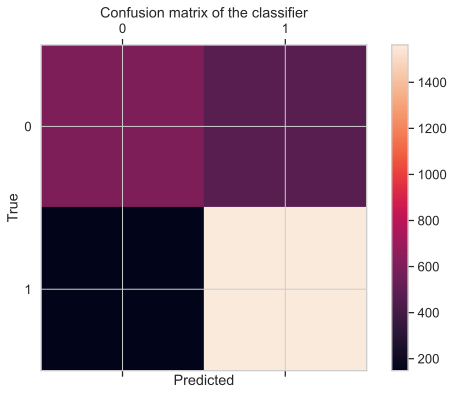

In [42]:
from sklearn.metrics import confusion_matrix

labels = [0,1]
cm = confusion_matrix(y2_test, preds_ovr, labels)
print(cm)
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(cm)
plt.title('Confusion matrix of the classifier')
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

**auc/roc**

No Skill: ROC AUC=0.500
Logistic: ROC AUC=0.686


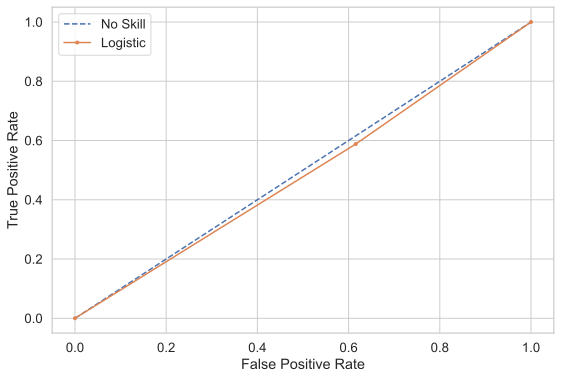

In [43]:
# roc curve and auc
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot

# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y2_test))]

# predict probabilities
lr_probs = DecsTree.predict_proba(X2_test)

# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]

# calculate scores
ns_auc = roc_auc_score(y2_test, ns_probs)
lr_auc = roc_auc_score(y2_test, lr_probs)

# summarize scores
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('Logistic: ROC AUC=%.3f' % (lr_auc))

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)

# plot the roc curve for the model
pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
pyplot.plot(lr_fpr, lr_tpr, marker='.', label='Logistic')

# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')

# show the legend
pyplot.legend()

# show the plot
pyplot.show()

In [61]:
#Calculate the y_score
y_score = dt_est.predict_proba(X_test)

In [62]:
#Binarize the output
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

y_test_bin = label_binarize(y_test, classes=[1960,1970,1980,1990,2000,2010])
n_classes = y_test_bin.shape[1]

In [63]:
print(y_test_bin)

[[1 0 0 0 0 0]
 [0 1 0 0 0 0]
 [1 0 0 0 0 0]
 ...
 [0 0 0 0 0 1]
 [0 0 0 0 1 0]
 [0 0 0 0 0 1]]


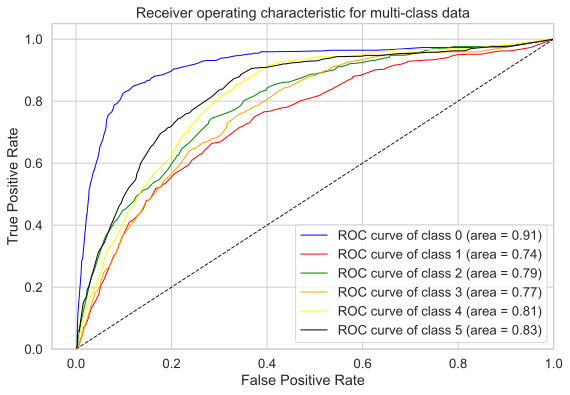

In [64]:
from itertools import cycle

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = cycle(['blue', 'red', 'green','orange','yellow','black'])
lw = 1
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

In [65]:
def get_multiclass_aucs(labels, scores, name='One-vs-Rest', kind='ovr'):
    ohe = OneHotEncoder()
    labels_ohe = ohe.fit_transform(labels)
    labels_ohe = labels_ohe.toarray()
    
    print(f'Average: {roc_auc_score(labels_ohe, scores, multi_class=kind)}')
    
    auc_scores = roc_auc_score(labels_ohe, scores, multi_class=kind, average=None)
    auc_scores = {i:s for i, s in enumerate(auc_scores)}
    
    return auc_scores

In [66]:
from sklearn.preprocessing import OneHotEncoder
from sklearn import datasets
from sklearn.metrics import roc_auc_score, confusion_matrix, roc_curve

print("One-vs-Rest\n")
#predict_proba_skfold = model_selection.cross_val_predict(results_skfold, X_test, y_test, cv=skfold,method='predict_proba')
get_multiclass_aucs(df_test[['decade']], y_score)

One-vs-Rest

Average: 0.810190761693455


{0: 0.9145804591995673,
 1: 0.7415306313454084,
 2: 0.7927636684303351,
 3: 0.7686363624687248,
 4: 0.812636862673049,
 5: 0.8309965860436459}

<br>

**TESTING**

**5a. trying to graph decision tree**

In [ ]:
#tree.plot_tree(clf)
#dtree1 = tree.export_graphviz(clf,  out_file=dtree1.dot, feature_names=features)
tree.export_graphviz(clf, out_file='dtree1.dot', feature_names=features)

In [ ]:
from subprocess import call
call(['dot', '-T', 'png', 'dtree1.dot', '-o', 'dtree1.png'])

#from subprocess import check_call
#check_call(['dot','-Tpng','dtree1.dot','-o','OutputFile.png'])

**5b. text decision tree mapping**

In [ ]:
text_representation = tree.export_text(clf)
#print(text_representation)

In [ ]:
with open("decision_tree.log", "w") as fout:
    fout.write(text_representation)

**5c. png decision tree**

In [ ]:
fig = plt.figure(figsize=(10,10))
_ = tree.plot_tree(clf, 
                   feature_names=features ,
                   class_names='decade',
                   filled=True)

In [ ]:
fig.savefig("decistion_tree.png")

**5d. png decision tree**

In [ ]:
import graphviz
# DOT data
dot_data = tree.export_graphviz(clf, out_file=None, 
                                feature_names=features,  
                                class_names='decade',
                                filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png") 
#graph

In [ ]:
graph.render("decision_tree_graphivz")


In [ ]:
sfdp -Tsvg -Goverlap=prism input.dot -o output.svg -v

**5e. dot decision tree**

In [ ]:
import pydotplus 
from IPython.display import Image

# Export/Print a decision tree in DOT format.
print(tree.export_graphviz(clf, None))

#Create Dot Data
dot_data = tree.export_graphviz(clf, out_file=None, feature_names=features, 
                                class_names=['1960','1970','1980','1990','2000','2010'], rounded=True, filled=True) #Gini decides which attribute/feature should be placed at the root node, which features will act as internal nodes or leaf nodes
#Create Graph from DOT data
graph = pydotplus.graph_from_dot_data(dot_data)

# Show graph
Image(graph.create_png())
